## Importing needed libraries

In [1]:
import pandas as pd
import math
import numpy as np
from plotnine import *
import patchworklib as pw
import statsmodels.api as sm
import statsmodels.formula.api as smf
from stargazer.stargazer import Stargazer
import warnings
%matplotlib inline
warnings.filterwarnings("ignore")
from currency_converter import CurrencyConverter
from datetime import timedelta
import scipy.stats as stats
from IPython.display import display
from mizani.formatters import percent_format
import copy
import statsmodels.nonparametric.kernel_regression as loess

## Checking the source data

In [2]:
data = pd.read_csv('listings.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10099 entries, 0 to 10098
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            10099 non-null  int64  
 1   listing_url                                   10099 non-null  object 
 2   scrape_id                                     10099 non-null  int64  
 3   last_scraped                                  10099 non-null  object 
 4   source                                        10099 non-null  object 
 5   name                                          10099 non-null  object 
 6   description                                   9735 non-null   object 
 7   neighborhood_overview                         3738 non-null   object 
 8   picture_url                                   10099 non-null  object 
 9   host_id                                       10099 non-null 

It turns out that both ID and listing URL are unique in our source data.

In [7]:
len(list(data['id'].unique())) == data.shape[0]

True

In [9]:
len(list(data['listing_url'].unique())) == data.shape[0]

True

All the non-unique variables together are non-duplicates.

In [11]:
data_headers = list(data.columns)
uniqueness_dc = {}
non_unique_headers = []
unique_headers = []
for c in data_headers:
    if len(list(data[c].unique())) == data.shape[0]:
        uniqueness_dc[c] = True
        unique_headers.append(c)
    else:
        uniqueness_dc[c] = False
        non_unique_headers.append(c)
print(unique_headers)
duplicates = data[data.duplicated(subset=non_unique_headers, keep=False)]
print(duplicates.shape[0])

['id', 'listing_url']
0


Some further duplicate checking: listings with the same name, description and host. There are 28 listings, for which these fields together are not unique. However, by manually checking some listings at random, we can see that the reason for the same properties is that these are actually very similar listings in rental complexes. So, we shall keep these, as they represent different observations.

In [13]:
duplicates = data[data.duplicated(subset=['name', 'description', 'host_id'], keep=False)]
duplicates.sort_values(['name', 'description', 'host_id'])[['name','listing_url','property_type']]

,name,listing_url,property_type
9675,Cozy room in Oslo City Center,https://www.airbnb.com/rooms/1176961922514387754,Private room in rental unit
9676,Cozy room in Oslo City Center,https://www.airbnb.com/rooms/1176964340053796267,Private room in rental unit
8357,Deluxe room in central Oslo,https://www.airbnb.com/rooms/1120844328872172996,Private room in rental unit
8480,Deluxe room in central Oslo,https://www.airbnb.com/rooms/1128255688957410984,Private room in rental unit
8481,Deluxe room in central Oslo,https://www.airbnb.com/rooms/1128471679055477602,Private room in rental unit
8020,Modern apartment close to city center,https://www.airbnb.com/rooms/1100826008821261912,Entire rental unit
8230,Modern apartment close to city center,https://www.airbnb.com/rooms/1113606710646601458,Entire rental unit
5225,Private room in house ~free parking ~terrace,https://www.airbnb.com/rooms/905911568724978102,Private room in guesthouse
5261,Private room in house ~free parking ~terrace,https://www.airbnb.com/rooms/907132143355784728,Private room in guesthouse
5250,Private room in house ~free parking ~terrace,https://www.airbnb.com/rooms/906654801119817521,Private room in guesthouse


Also, how come the pictures of the apartments are not unique? It turns out that these listings are either indeed very very similar, and the host uses the same pictures for different listings, or that the only the listings main picture is the same (e.g. from the outside of the complex or hotel), and the actual pictures of the rooms differ. Nonetheless, we cannot say that these listings are duplicates, so we will keep them.

In [15]:
duplicates = data[data.duplicated(subset=['picture_url'], keep=False)]
duplicates.sort_values(['picture_url'])[['name','listing_url','picture_url', 'price']]

,name,listing_url,picture_url,price
1201,Urban Apartments Grünerløkka 2-bedrooms,https://www.airbnb.com/rooms/32200763,https://a0.muscache.com/pictures/0185c257-a0c0...,"$1,298.00"
1198,Urban Apartments Grünerløkka 2-bedrooms,https://www.airbnb.com/rooms/32198312,https://a0.muscache.com/pictures/0185c257-a0c0...,"$1,298.00"
1191,Urban Apartments Grünerløkka 2-bedrooms,https://www.airbnb.com/rooms/31968840,https://a0.muscache.com/pictures/0185c257-a0c0...,"$1,298.00"
8171,Charming and Classic room in Frogner Oslo,https://www.airbnb.com/rooms/1110028445694763183,https://a0.muscache.com/pictures/2a174966-7d78...,"$1,800.00"
810,Charming and Classic apartment in Frogner Oslo,https://www.airbnb.com/rooms/21002290,https://a0.muscache.com/pictures/2a174966-7d78...,"$2,200.00"
...,...,...,...,...
6671,Rom for deg på herlige Rodeløkka,https://www.airbnb.com/rooms/982653911859829797,https://a0.muscache.com/pictures/miso/Hosting-...,NaN
8855,Cozy apartment in Sagene,https://www.airbnb.com/rooms/1148613770058266796,https://a0.muscache.com/pictures/miso/Hosting-...,"$1,300.00"
6752,Beautiful rom in new apartment,https://www.airbnb.com/rooms/989118654435072703,https://a0.muscache.com/pictures/miso/Hosting-...,$598.00
7650,Koselig soverom nær Bogstadveien,https://www.airbnb.com/rooms/1078031122098871645,https://a0.muscache.com/pictures/miso/Hosting-...,$564.00


Even though we can be confident that there are no obvious duplicates, we might want to run the default drop duplicates method just in case. As expected, it does not drop anything.

In [17]:
data.drop_duplicates(inplace=True)
data.shape

(10099, 75)

All in all, we can conclude that are source data is free of duplicates.

# Narrowing down to our variables of potential interest

Now, we can filter out our variables of interest for further analyis. Before doing the analysis, however, we shall check our chosen variables' characteristics in detail.

In [19]:
data_f = data.filter(['id', 'price', 'last_scraped', 'property_type', 'room_type', 'neighbourhood_cleansed',
                      'accommodates','latitude', 'longitude', 'host_acceptance_rate',
                      'number_of_reviews', 'review_scores_rating'])

First, we have to deal with the appropriate formatting of the data:
- last scraped should be a DateTime object (this is only needed for converting our price variables from NOK to EUR on the appropriate rates),
- price should be a numeric value, converted from NOK to EUR on the exchange rate of the scrape's date,
- host acceptance and host response rates should be converted into a numeric value we keep them, however in the range (0,100) so that we can easily interpret regression results later as percentage point changes.

We first define a function that converts between two currencies on a specific date, and if the date has no conversion rate, we convert the value on the most recent value relative to that date.

In [21]:
c = CurrencyConverter()
def convert_with_fallback(amount, from_currency, to_currency, date):
    while True:
        try:
            return c.convert(amount, from_currency, to_currency, date=date)
        except:
            date -= timedelta(days=1)

We can now make the appropriate type conversions.

In [23]:
data_f['last_scraped'] = pd.to_datetime(data_f.last_scraped, format = '%Y-%m-%d')
data_f['price'] = data_f.apply(
    lambda row: np.nan if pd.isna(row['price']) else convert_with_fallback(
        float(str(row['price']).replace('$', '').replace(',', '')),
        'NOK', 'EUR',
        row['last_scraped']
    ), axis=1
)
data_f.rename(columns={'price' : 'price_EUR'}, inplace = True)
data_f['host_acceptance_rate'] = data_f['host_acceptance_rate'].map(lambda x: np.nan if pd.isna(x) else float(str(x).replace('%','')))

After that, we define a function that calculates the distance between a listing's coordinates and the city center of Oslo. For this, we use the haversine formula.

In [25]:
def distance_to_center(lat, lon):
    # Oslo city center coordinates
    oslo_lat = 59.9139
    oslo_lon = 10.7522
    
    # Radius of Earth in kilometers
    R = 6371.0
    
    # Convert degrees to radians
    lat1, lon1 = math.radians(oslo_lat), math.radians(oslo_lon)
    lat2, lon2 = math.radians(lat), math.radians(lon)
    
    # Differences in coordinates
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    # Haversine formula
    a = math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    
    # Distance in kilometers
    distance = R * c
    
    return distance

Now we can add a calculated column with the distance for each listing to the city center.

In [27]:
data_f['distance_to_center'] = data_f.apply(lambda row: distance_to_center(row['latitude'], row['longitude']), axis=1)

We can drop the coordinates and the scrape's date, as we only needed these for the above calculations. Also, we can be sure that these fields did not introduce any unwanted errors or missing data as all of them had 0 missing values.

In [29]:
data_f.drop(['latitude','longitude', 'last_scraped'], axis = 1, inplace=True)

We should also create a variable capturing the per guest price!

In [31]:
data_f['price_per_guest'] = np.where(
    data_f['price_EUR'].isna() | data_f['accommodates'].isna(),
    np.nan,
    data_f['price_EUR'] / data_f['accommodates']
)

In [33]:
data_f.isna().sum() / 10099 * 100

id                         0.000000
price_EUR                 12.367561
property_type              0.000000
room_type                  0.000000
neighbourhood_cleansed     0.000000
accommodates               0.000000
host_acceptance_rate      12.961679
number_of_reviews          0.000000
review_scores_rating      26.873948
distance_to_center         0.000000
price_per_guest           12.367561
dtype: float64

First, let's look at some summary statistics of our quantitative variables to get a basic idea of the distributions.

In [35]:
data_f.describe(percentiles=[0.05,0.25, 0.5, 0.75, 0.95]).T[1:]

,count,mean,std,min,5%,25%,50%,75%,95%,max
price_EUR,8850.0,148.413858,201.634243,14.039398,52.647743,85.201597,114.464967,166.959154,314.658009,9652.086167
accommodates,10099.0,3.439251,1.810203,1.000000,1.000000,2.000000,3.000000,4.000000,7.000000,16.000000
host_acceptance_rate,8790.0,68.241638,33.167450,0.000000,0.000000,50.000000,79.000000,100.000000,100.000000,100.000000
number_of_reviews,10099.0,16.598970,43.616216,0.000000,0.000000,0.000000,4.000000,14.000000,75.000000,1161.000000
review_scores_rating,7385.0,4.831836,0.307867,1.000000,4.330000,4.780000,4.940000,5.000000,5.000000,5.000000
distance_to_center,10099.0,2.785987,2.056467,0.102713,0.685747,1.405728,2.171893,3.427434,7.036663,14.518127
price_per_guest,8850.0,46.054944,60.266076,5.849749,20.181635,29.248746,39.485807,52.647743,83.358926,3217.362056


From the summary stats, we can identify that:
- price has a long right tail with very big extreme values there,
- number of people accomodatable is also skewed, with large maximums,
- host response rate does not show much variation, as most of the observation have this at 100,
- host acceptance rate has more variation, so it can be more useful for the analysis,
- number of reviews is also very skewed with a long right tail,
- most of the ratings fall between 4 and 5,
- distance to center also has a long right tail with some extreme values,
- price per guest also has a long right tail with extreme values.

We should also plot these distributions.

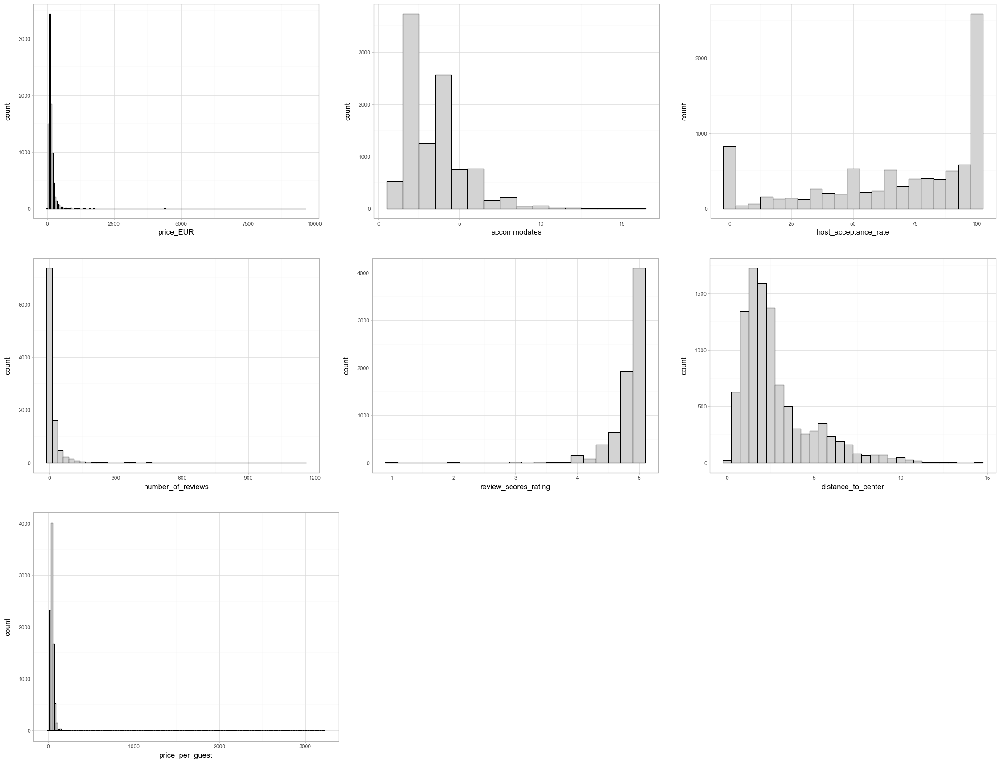

In [37]:
pw.basefigure.clear()
gg_hists = []
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'price_EUR')
    + geom_histogram(binwidth = 50, color = 'black', fill = 'lightgrey')
    + theme_light()
)
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'accommodates')
    + geom_histogram(binwidth = 1, color = 'black', fill = 'lightgrey')
    + theme_light()
)
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'host_acceptance_rate')
    + geom_histogram(binwidth = 5, color = 'black', fill = 'lightgrey')
    + theme_light()
)
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'number_of_reviews')
    + geom_histogram(binwidth = 25, color = 'black', fill = 'lightgrey')
    + theme_light()
)
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'review_scores_rating')
    + geom_histogram(binwidth = 0.2, color = 'black', fill = 'lightgrey')
    + theme_light()
)
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'distance_to_center')
    + geom_histogram(binwidth = 0.5, color = 'black', fill = 'lightgrey')
    + theme_light()
)
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'price_per_guest')
    + geom_histogram(binwidth = 20, color = 'black', fill = 'lightgrey')
    + theme_light()
)
gg_hists.append(ggplot(data_f)+theme_void())
gg_hists.append(ggplot(data_f)+theme_void())
pl = []
for p in gg_hists:
    pl.append(pw.load_ggplot(p))
combined = (
    (pl[0]|pl[1]|pl[2])
    /(pl[3]|pl[4]|pl[5])
    /(pl[6]|pl[7]|pl[8])
)
combined.savefig()

We should also take a look at the values of categorical variables. Room types and neighbourhoods seem clean, but property types are quite dispersed, so it might be a good idea to group them into fewer, broader categories.

In [39]:
print(f'total: {data_f.property_type.count()}')
print(data_f.property_type.value_counts())

total: 10099
property_type
Entire rental unit                    5429
Entire condo                          2316
Private room in rental unit            764
Entire home                            609
Private room in condo                  308
Entire townhouse                       111
Private room in home                   107
Entire loft                             87
Entire villa                            55
Entire serviced apartment               39
Shared room in rental unit              35
Entire guest suite                      25
Camper/RV                               21
Private room in bed and breakfast       21
Private room in guesthouse              18
Private room in loft                    17
Private room in townhouse               16
Entire guesthouse                       14
Room in boutique hotel                  13
Private room in villa                   13
Tiny home                                9
Entire cabin                             8
Shared room in condo       

In [41]:
print(f'total: {data_f.room_type.count()}')
print(data_f.room_type.value_counts())

total: 10099
room_type
Entire home/apt    8747
Private room       1305
Shared room          46
Hotel room            1
Name: count, dtype: int64


In [43]:
print(f'total: {data_f.neighbourhood_cleansed.count()}')
print(data_f.neighbourhood_cleansed.value_counts())

total: 10099
neighbourhood_cleansed
Grünerløkka          1950
Gamle Oslo           1844
Frogner              1483
St. Hanshaugen       1127
Sagene               1089
Nordstrand            445
Nordre Aker           382
Vestre Aker           352
Ullern                290
Østensjø              261
Bjerke                254
Alna                  209
Sentrum               146
Søndre Nordstrand     124
Grorud                 67
Marka                  40
Stovner                36
Name: count, dtype: int64


So, we shall group property types in fewer groups.

In [45]:
property_type_mapping = {
    "Entire rental unit": "Apt/Condo",
    "Entire condo": "Apt/Condo",
    "Entire loft": "Apt/Condo",
    "Entire serviced apartment": "Apt/Condo",
    "Entire home/apt": "Apt/Condo",
    "Private room in rental unit": "Private Room - Apt/Condo",
    "Private room in condo": "Private Room - Apt/Condo",
    "Private room in loft": "Private Room - Apt/Condo",
    "Private room": "Private Room - Apt/Condo",
    "Entire home": "House/Townhouse",
    "Entire townhouse": "House/Townhouse",
    "Entire vacation home": "House/Townhouse",
    "Entire cottage": "House/Townhouse",
    "Entire bungalow": "House/Townhouse",
    "Entire chalet": "House/Townhouse",
    "Entire villa": "House/Townhouse",
    "Entire cabin": "House/Townhouse",
    "Private room in home": "Private Room - House",
    "Private room in townhouse": "Private Room - House",
    "Private room in villa": "Private Room - House",
    "Private room in vacation home": "Private Room - House",
    "Private room in cottage": "Private Room - House",
    "Entire guest suite": "Guest Suite/House",
    "Entire guesthouse": "Guest Suite/House",
    "Private room in guesthouse": "Guest Suite/House",
    "Private room in guest suite": "Guest Suite/House",
    "Shared room in rental unit": "Shared Room",
    "Shared room in condo": "Shared Room",
    "Shared room in loft": "Shared Room",
    "Shared room in farm stay": "Shared Room",
    "Shared room in townhouse": "Shared Room",
    "Room in boutique hotel": "Hotel-Like",
    "Room in aparthotel": "Hotel-Like",
    "Room in hotel": "Hotel-Like",
    "Room in serviced apartment": "Hotel-Like",
    "Camper/RV": "Unique Stays",
    "Boat": "Unique Stays",
    "Tent": "Unique Stays",
    "Dome": "Unique Stays",
    "Yurt": "Unique Stays",
    "Tiny home": "Unique Stays",
    "Casa particular": "Unique Stays",
    "Private room in boat" : "Unique Stays",
    "Private room in bed and breakfast": "Private Room - B&B",
    "Private room in serviced apartment": "Private Room - B&B",
    "Private room in casa particular": "Private Room - B&B",
}
data_f['property_type_grouped'] = data_f['property_type'].replace(property_type_mapping)
data_f['property_type_grouped'].value_counts()

property_type_grouped
Apt/Condo                   7872
Private Room - Apt/Condo    1093
House/Townhouse              791
Private Room - House         138
Guest Suite/House             59
Unique Stays                  49
Shared Room                   46
Private Room - B&B            29
Hotel-Like                    22
Name: count, dtype: int64

# Checking Missing Values

Before moving on with narrowing down the scope of our analyis and managing the skewed distributions, we should take a look at whether data in our table is missing at random. To check this, we should compare the distributions of the other quantitative variables conditional on whether an observation in another field is missing. We can do this two ways: by formal statistical testing, or by visualizing the distributions.

Note that we should not worry about missing values in price per guest, as we have set this to be missing only if both price and accomodated people is missing. So these two should capture missing values in price per guest as well.

From the statistical results and the charts we can see the following:
- For the price:
  - Number of people accomodated seems okay graphically, but statistical tests show a difference.
  - Distance to center seems to be okay, the conditional distributions look the same, backed by formal testing (same if distance is log transformed).
  - Host response rate is different conditional on price missing - this is because many of 100 response rates are for observations when the price is missing. So, observations with missing price have on average a higher host response rate.
  - Host acceptance rate seems to be graphically okay - however, formally the tests fail. So formally, for observations where price is missing, host acceptance rate is a bit higher.
  - Number of reviews seems okay, and it is backed by formal testing if log transformed.
  - Review scores rating is also okay, both graphically and statistically.
- For the host acceptance rate:
  - price is a bit smaller when acceptance rate is not missing,
  - number of people accomodated is quite similar for both missing and non-missing, but the heights of the modes differ a lot,
  - distance to center is a bit smaller when acceptance rate is not missing,
  - number of reviews are smaller when acceptance rate is missing,
  - ratings are very similar for both groups, difference is rejected by formal testing. 
- For the ratings:
  - There is some difference in distributions and means (both statistically and graphically) but this might not be a problem, as missing ratings are meaningful: ratings should be missing when the number of reviews is zero - and in fact, they are missing if and only if the number of reviews is zero.
- For the number of people accomodated, distance to center and number of reviews, there are no missing values.

All in all, we can see that unfortunately, missing observations are not at random: some important covariates are different for observations that are missing another coveriate from those that are not. We should take into account these differences when interpreting the results.

In [ ]:
print('\n\nNon-transformed variables')
# List of columns to test
columns_to_test = ['price_EUR', 'accommodates', 'distance_to_center', 'host_acceptance_rate', 'number_of_reviews', 'review_scores_rating']

# Initialize an empty dictionary to store results
all_results = {}

# Iterate over each column and perform t-test and Mann-Whitney U test for missing vs non-missing values of that column
for target_column in columns_to_test:
    # Initialize list to store results for each target column
    results = []
    
    for column in columns_to_test:
        if column == target_column:
            continue
        
        # Create two groups based on whether the target_column is missing or not
        group_target_non_missing = data_f[data_f[target_column].notna()][column]
        group_target_missing = data_f[data_f[target_column].isna()][column]
        
        # Perform t-test (assuming normal distribution in both groups)
        t_stat, t_p_val = stats.ttest_ind(group_target_non_missing.dropna(), group_target_missing.dropna(), equal_var=False)
        
        # Check if both groups are non-empty before running Mann-Whitney U test
        if len(group_target_non_missing.dropna()) > 0 and len(group_target_missing.dropna()) > 0:
            # Perform Mann-Whitney U test
            u_stat, u_p_val = stats.mannwhitneyu(group_target_non_missing.dropna(), group_target_missing.dropna())
        else:
            u_p_val = None  # Assign None if the group is empty
        
        # Determine human-readable result for t-test
        if t_p_val < 0.05:
            t_test_result = "means diff"
        else:
            t_test_result = "means not diff"
        
        # Determine human-readable result for Mann-Whitney U test (if p-value exists)
        if u_p_val is not None:
            if u_p_val < 0.05:
                mw_u_test_result = "distr diff"
            else:
                mw_u_test_result = "distr not diff"
        else:
            mw_u_test_result = "MWU not possible"
        
        # Append the results for each column to the results list
        results.append({
            'Column': column,
            'T-test p-value': t_p_val,
            'Mann-Whitney U test p-value': u_p_val,
            'T-test Result': t_test_result,
            'Mann-Whitney U test Result': mw_u_test_result
        })
    
    # Store the results in the all_results dictionary
    all_results[target_column] = pd.DataFrame(results)

# Print the results for each column
for target_column, result_df in all_results.items():
    if data_f[target_column].isna().sum() != 0:
        print(f"\n\nResults for {target_column}:")
        display(result_df)
    else:
        print(f'\n\nNo missing data for {target_column}.')

print('\n\nLog-transformed variables')

# Initialize an empty dictionary to store results
all_results = {}

# Iterate over each column and perform t-test and Mann-Whitney U test for missing vs non-missing values of that column
for target_column in columns_to_test:
    # Initialize list to store results for each target column
    results = []
    
    for column in columns_to_test:
        if column == target_column:
            continue
        
        # Create two groups based on whether the target_column is missing or not
        group_target_non_missing = np.log(data_f[data_f[target_column].notna()][column])
        group_target_missing = np.log(data_f[data_f[target_column].isna()][column])
        
        # Perform t-test (assuming normal distribution in both groups)
        t_stat, t_p_val = stats.ttest_ind(group_target_non_missing.dropna(), group_target_missing.dropna(), equal_var=False)
        
        # Check if both groups are non-empty before running Mann-Whitney U test
        if len(group_target_non_missing.dropna()) > 0 and len(group_target_missing.dropna()) > 0:
            # Perform Mann-Whitney U test
            u_stat, u_p_val = stats.mannwhitneyu(group_target_non_missing.dropna(), group_target_missing.dropna())
        else:
            u_p_val = None  # Assign None if the group is empty
        
        # Determine human-readable result for t-test
        if t_p_val < 0.05:
            t_test_result = "means diff"
        else:
            t_test_result = "means not diff"
        
        # Determine human-readable result for Mann-Whitney U test (if p-value exists)
        if u_p_val is not None:
            if u_p_val < 0.05:
                mw_u_test_result = "distr diff"
            else:
                mw_u_test_result = "distr not diff"
        else:
            mw_u_test_result = "MWU not possible"
        
        # Append the results for each column to the results list
        results.append({
            'Column': column,
            'T-test p-value': t_p_val,
            'Mann-Whitney U test p-value': u_p_val,
            'T-test Result': t_test_result,
            'Mann-Whitney U test Result': mw_u_test_result
        })
    
    # Store the results in the all_results dictionary
    all_results[target_column] = pd.DataFrame(results)
# Print the results for each column
for target_column, result_df in all_results.items():
    if data_f[target_column].isna().sum() != 0:
        print(f"\n\nResults for {target_column}:")
        display(result_df)
    else:
        print(f'\n\nNo missing data for {target_column}.')

In [47]:
data_f['p_na'] = data_f['price_EUR'].map(lambda x: True if pd.isna(x) else False)
data_f['a_na'] = data_f['accommodates'].map(lambda x: True if pd.isna(x) else False)
data_f['dtc_na'] = data_f['distance_to_center'].map(lambda x: True if pd.isna(x) else False)
data_f['har_na'] = data_f['host_acceptance_rate'].map(lambda x: True if pd.isna(x) else False)
data_f['nor_na'] = data_f['number_of_reviews'].map(lambda x: True if pd.isna(x) else False)
data_f['rsr_na'] = data_f['review_scores_rating'].map(lambda x: True if pd.isna(x) else False)
data_f['ppg_na'] = data_f['price_per_guest'].map(lambda x: True if pd.isna(x) else False)

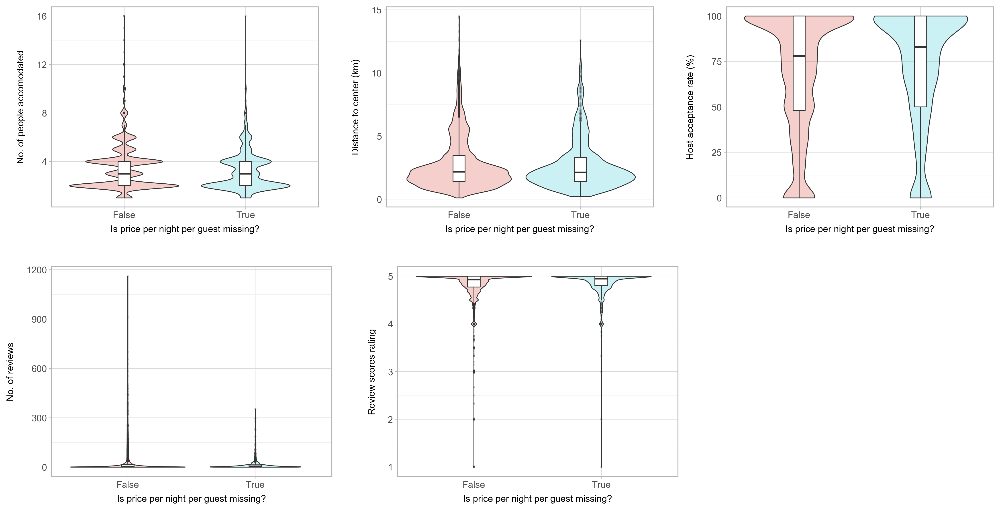

In [49]:
pw.basefigure.clear()
p1 = (
    ggplot(data_f)
    + aes(y = 'accommodates', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'No. of people accomodated')
)

p2 = (
    ggplot(data_f)
    + aes(y = 'distance_to_center', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'Distance to center (km)')
)

p3 = (
    ggplot(data_f)
    + aes(y = 'host_acceptance_rate', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'Host acceptance rate (%)')
)

p4 = (
    ggplot(data_f)
    + aes(y = 'number_of_reviews', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'No. of reviews')
)

p5 = (
    ggplot(data_f)
    + aes(y = 'review_scores_rating', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'Review scores rating')
)
p6 = ggplot(data_f)+theme_void()+theme(figure_size=(4, 3))
p1 = pw.load_ggplot(p1)
p2 = pw.load_ggplot(p2)
p3 = pw.load_ggplot(p3)
p4 = pw.load_ggplot(p4)
p5 = pw.load_ggplot(p5)
p6 = pw.load_ggplot(p6)
combined = (p1|p2|p3)/(p4|p5|p6)
combined.savefig('ppg_missing_boxplots_normal.png')
display(combined)

In [50]:
data_f['nor_shifted'] = data_f['number_of_reviews'].map(lambda x: 1 if x == 0 else x)
data_f['har_shifted'] = data_f['host_acceptance_rate'].map(lambda x: 1 if x == 0 else x)

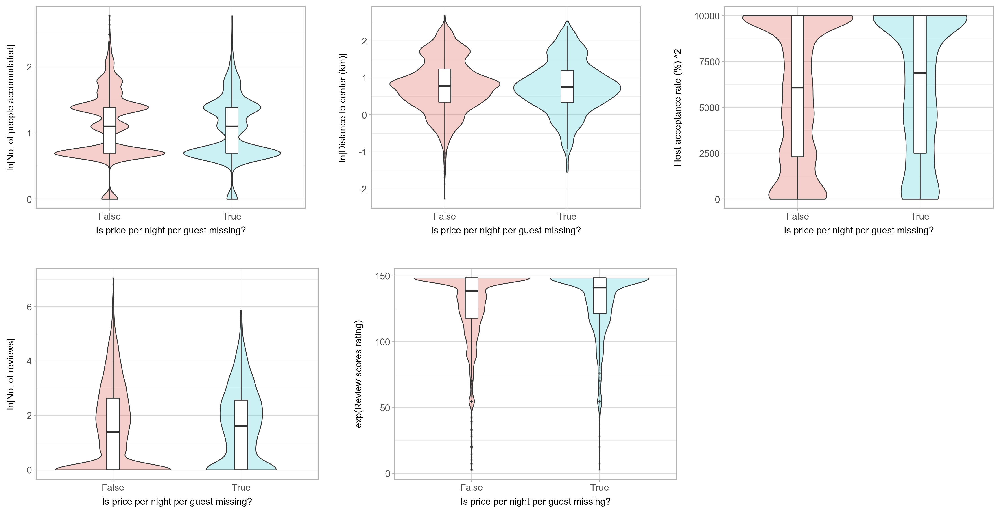

In [51]:
pw.basefigure.clear()
p1 = (
    ggplot(data_f)
    + aes(y = 'np.log(accommodates)', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'ln[No. of people accomodated]')
)

p2 = (
    ggplot(data_f)
    + aes(y = 'np.log(distance_to_center)', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'ln[Distance to center (km)]')
)

p3 = (
    ggplot(data_f)
    + aes(y = 'np.power(host_acceptance_rate,2)', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'Host acceptance rate (%) ^2')
)

p4 = (
    ggplot(data_f)
    + aes(y = 'np.log(nor_shifted)', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'ln[No. of reviews]')
)

p5 = (
    ggplot(data_f)
    + aes(y = 'np.exp(review_scores_rating)', x = 'ppg_na')
    + geom_violin(aes(fill = 'ppg_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'exp(Review scores rating)')
)
p6 = ggplot(data_f)+theme_void()+theme(figure_size=(4, 3))
p1 = pw.load_ggplot(p1)
p2 = pw.load_ggplot(p2)
p3 = pw.load_ggplot(p3)
p4 = pw.load_ggplot(p4)
p5 = pw.load_ggplot(p5)
p6 = pw.load_ggplot(p6)
combined = (p1|p2|p3)/(p4|p5|p6)
combined.savefig('ppg_missing_boxplots_transformed.png')
display(combined)

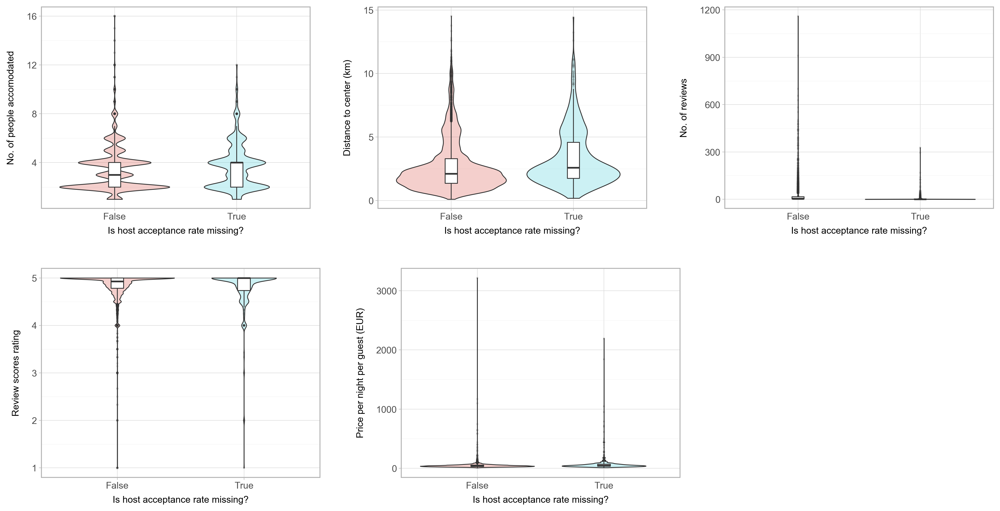

In [54]:
pw.basefigure.clear()
p1 = (
    ggplot(data_f)
    + aes(y = 'accommodates', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is host acceptance rate missing?', y = 'No. of people accomodated')
)

p2 = (
    ggplot(data_f)
    + aes(y = 'distance_to_center', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is host acceptance rate missing?', y = 'Distance to center (km)')
)

p3 = (
    ggplot(data_f)
    + aes(y = 'number_of_reviews', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is host acceptance rate missing?', y = 'No. of reviews')
)

p4 = (
    ggplot(data_f)
    + aes(y = 'review_scores_rating', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is host acceptance rate missing?', y = 'Review scores rating')
)

p5 = (
    ggplot(data_f)
    + aes(y = 'price_per_guest', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is host acceptance rate missing?', y = 'Price per night per guest (EUR)')
)
p6 = ggplot(data_f)+theme_void()+theme(figure_size=(4, 3))
p1 = pw.load_ggplot(p1)
p2 = pw.load_ggplot(p2)
p3 = pw.load_ggplot(p3)
p4 = pw.load_ggplot(p4)
p5 = pw.load_ggplot(p5)
p6 = pw.load_ggplot(p6)
combined = (p1|p2|p3)/(p4|p5|p6)
combined.savefig('har_missing_boxplots_normal.png')
display(combined)

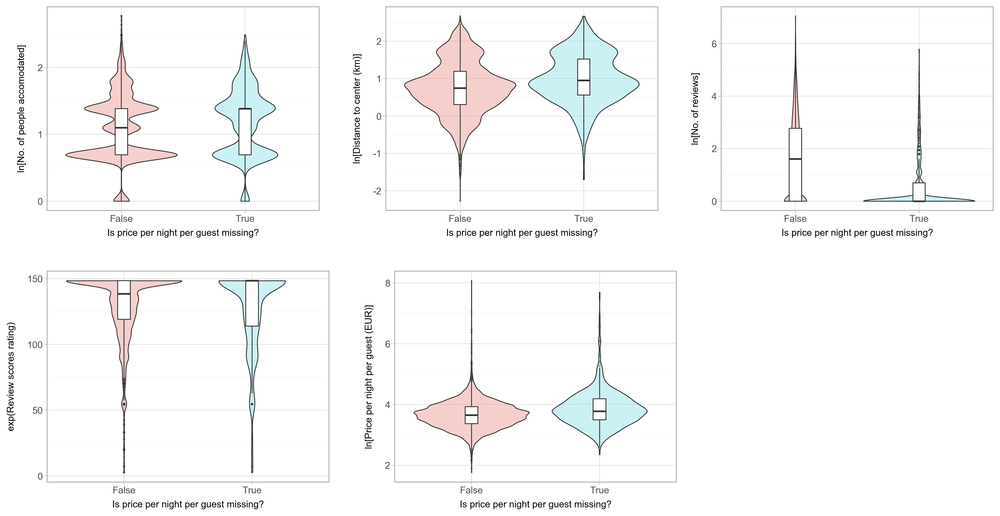

In [56]:
pw.basefigure.clear()
p1 = (
    ggplot(data_f)
    + aes(y = 'np.log(accommodates)', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'ln[No. of people accomodated]')
)

p2 = (
    ggplot(data_f)
    + aes(y = 'np.log(distance_to_center)', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'ln[Distance to center (km)]')
)

p3 = (
    ggplot(data_f)
    + aes(y = 'np.log(nor_shifted)', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'ln[No. of reviews]')
)

p4 = (
    ggplot(data_f)
    + aes(y = 'np.exp(review_scores_rating)', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'exp(Review scores rating)')
)

p5 = (
    ggplot(data_f)
    + aes(y = 'np.log(price_per_guest)', x = 'har_na')
    + geom_violin(aes(fill = 'har_na'), alpha = 0.3, show_legend = False)
    + geom_boxplot(width = 0.1, outlier_alpha = 0.1, outlier_size = 0.5)
    + theme_light()
    + theme(figure_size=(4, 3), text=element_text(size=10))
    + labs(x = 'Is price per night per guest missing?', y = 'ln[Price per night per guest (EUR)]')
)
p6 = ggplot(data_f)+theme_void()+theme(figure_size=(4, 3))
p1 = pw.load_ggplot(p1)
p2 = pw.load_ggplot(p2)
p3 = pw.load_ggplot(p3)
p4 = pw.load_ggplot(p4)
p5 = pw.load_ggplot(p5)
p6 = pw.load_ggplot(p6)
combined = (p1|p2|p3)/(p4|p5|p6)
combined.savefig('har_missing_boxplots_transformed.png')
display(combined)

# Narrowing down the sample

We should now narrow down the scope of our analysis to what makes sense to us! For this, first let's look at some summary statistics and distributions first.

In [58]:
data_f.describe(percentiles=[0.01,0.05,0.25, 0.5, 0.75, 0.95,0.99]).T[1:]

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
price_EUR,8850.0,148.413858,201.634243,14.039398,37.730882,52.647743,85.201597,114.464967,166.959154,314.658009,570.350546,9652.086167
accommodates,10099.0,3.439251,1.810203,1.000000,1.000000,1.000000,2.000000,3.000000,4.000000,7.000000,10.000000,16.000000
host_acceptance_rate,8790.0,68.241638,33.167450,0.000000,0.000000,0.000000,50.000000,79.000000,100.000000,100.000000,100.000000,100.000000
number_of_reviews,10099.0,16.598970,43.616216,0.000000,0.000000,0.000000,0.000000,4.000000,14.000000,75.000000,195.040000,1161.000000
review_scores_rating,7385.0,4.831836,0.307867,1.000000,3.750000,4.330000,4.780000,4.940000,5.000000,5.000000,5.000000,5.000000
distance_to_center,10099.0,2.785987,2.056467,0.102713,0.418558,0.685747,1.405728,2.171893,3.427434,7.036663,9.839420,14.518127
price_per_guest,8850.0,46.054944,60.266076,5.849749,15.333655,20.181635,29.248746,39.485807,52.647743,83.358926,141.511210,3217.362056
nor_shifted,10099.0,16.867710,43.516070,1.000000,1.000000,1.000000,1.000000,4.000000,14.000000,75.000000,195.040000,1161.000000
har_shifted,8790.0,68.335495,32.975043,1.000000,1.000000,1.000000,50.000000,79.000000,100.000000,100.000000,100.000000,100.000000


In [59]:
data_f[['price_per_guest', 'distance_to_center']].describe(percentiles=[0.05,0.25, 0.5, 0.75, 0.95]).T.applymap(lambda x: format(x, '.2f'))

,count,mean,std,min,5%,25%,50%,75%,95%,max
price_per_guest,8850.00,46.05,60.27,5.85,20.18,29.25,39.49,52.65,83.36,3217.36
distance_to_center,10099.00,2.79,2.06,0.10,0.69,1.41,2.17,3.43,7.04,14.52


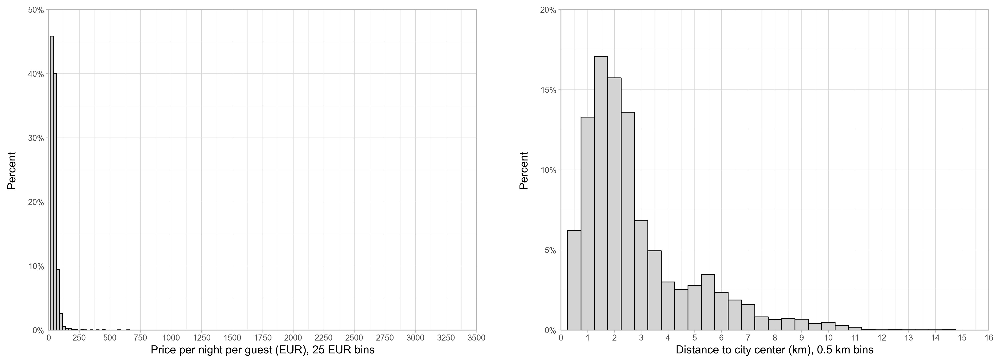

In [63]:
pw.basefigure.clear()
gg_hists = []
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'price_per_guest')
    + geom_histogram(aes(y=after_stat("count / np.sum(count)")),
                     binwidth = 25,
                     color = 'black',
                     fill = 'lightgrey'
                    )
    + theme_light()
    + scale_x_continuous(expand=(0, 0), limits=(0, 3500), breaks=range(0, 3501,250))
    + scale_y_continuous(expand=(0, 0),
                         limits = (0,0.5),
                         breaks=np.arange(0,0.51,0.1),
                         labels=percent_format()
                        )
    + labs(x = 'Price per night per guest (EUR), 25 EUR bins', y = 'Percent')
)
gg_hists.append(
    ggplot(data_f)
    + aes(x = 'distance_to_center')
    + geom_histogram(aes(y=after_stat("count / np.sum(count)")),
                     binwidth = 0.5,
                     color = 'black',
                     fill = 'lightgrey'
                    )
    + theme_light()
    + scale_x_continuous(expand=(0, 0), limits=(0, 16), breaks=np.arange(0,17,1))
    + scale_y_continuous(expand=(0, 0),
                         limits = (0,0.2),
                         breaks=np.arange(0,0.21,0.05),
                         labels=percent_format()
                        )
    + labs(x = 'Distance to city center (km), 0.5 km bins', y = 'Percent')
)
pl = []
for p in gg_hists:
    pl.append(pw.load_ggplot(p))
combined = pl[0]|pl[1]
combined.savefig('ppg_dist_histograms_unfiltered.png')
display(combined)

Let's imagine that we are travelling with a big family (but we don't mind booking more than one listing and separating), slightly on a budget, and we do not really like commuting a lot on or holiday. We want to find which AirBnB is the best deal for us.

So, formally, we narrow down the scope of our analysis for these factors:
- price should be 100 EUR per night per person maximum,
- only interested in listings that accommodate 6 or less people,
- distance to center should be 10 km maximum

Now our analysis will only be valid for these types of listings in Oslo - we cannot say anything about the whole AirBnB market in Oslo in general.

In [65]:
data_ppgd = (data_f[
              (data_f['price_per_guest'] <= 100)
              & (data_f['distance_to_center'] <= 10)
              & (data_f['accommodates'] <= 6)
          ])

In [67]:
data_ppgd.describe(percentiles=[0.01,0.05,0.25, 0.5, 0.75, 0.95, 0.99]).T[1:]

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
price_EUR,8080.0,126.812742,66.369739,14.039398,37.730882,52.380117,83.358926,110.209275,153.555916,257.570307,363.532664,589.128241
accommodates,8080.0,3.202599,1.376034,1.000000,1.000000,1.000000,2.000000,3.000000,4.000000,6.000000,6.000000,6.000000
host_acceptance_rate,7113.0,67.559679,33.292866,0.000000,0.000000,0.000000,47.000000,77.000000,100.000000,100.000000,100.000000,100.000000
number_of_reviews,8080.0,17.360396,46.007456,0.000000,0.000000,0.000000,0.000000,4.000000,14.000000,79.000000,201.260000,1161.000000
review_scores_rating,5918.0,4.829845,0.307256,1.000000,3.750000,4.330000,4.770000,4.930000,5.000000,5.000000,5.000000,5.000000
distance_to_center,8080.0,2.662357,1.883616,0.153159,0.420432,0.682592,1.378095,2.136149,3.243754,6.668848,8.997266,9.986113
price_per_guest,8080.0,41.945869,16.426677,5.849749,15.680033,20.685079,29.628980,39.485807,51.704471,74.584302,87.746238,99.964902
nor_shifted,8080.0,17.627970,45.908501,1.000000,1.000000,1.000000,1.000000,4.000000,14.000000,79.000000,201.260000,1161.000000
har_shifted,7113.0,67.654154,33.101862,1.000000,1.000000,1.000000,47.000000,77.000000,100.000000,100.000000,100.000000,100.000000


In [69]:
data_ppgd[['price_per_guest', 'distance_to_center']].describe(percentiles=[0.05,0.25, 0.5, 0.75, 0.95]).T.applymap(lambda x: format(x, '.2f'))

,count,mean,std,min,5%,25%,50%,75%,95%,max
price_per_guest,8080.00,41.95,16.43,5.85,20.69,29.63,39.49,51.70,74.58,99.96
distance_to_center,8080.00,2.66,1.88,0.15,0.68,1.38,2.14,3.24,6.67,9.99


In [71]:
data_ppgd = data_ppgd.filter(['id', 'price_per_guest', 'distance_to_center'])
data_ppgd['ln_price_per_guest'] = data_ppgd['price_per_guest'].map(lambda x: np.log(x))
data_ppgd['ln_distance_to_center'] = data_ppgd['distance_to_center'].map(lambda x: np.log(x))

In [73]:
data_ppgd[['ln_price_per_guest', 'ln_distance_to_center']].describe(percentiles=[0.05,0.25, 0.5, 0.75, 0.95]).T.applymap(lambda x: format(x, '.2f'))

,count,mean,std,min,5%,25%,50%,75%,95%,max
ln_price_per_guest,8080.00,3.66,0.39,1.77,3.03,3.39,3.68,3.95,4.31,4.60
ln_distance_to_center,8080.00,0.75,0.68,-1.88,-0.38,0.32,0.76,1.18,1.90,2.30


From the below charts, we can see that both our variables of interest are rather log-normally distributed.

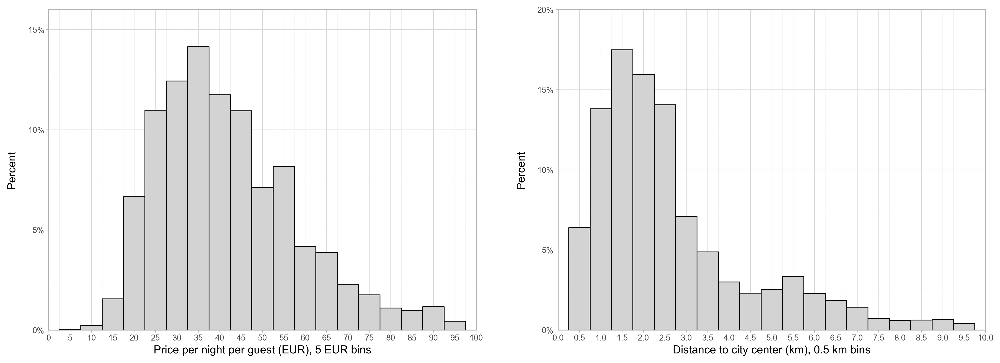

In [75]:
pw.basefigure.clear()
gg_hists = []
gg_hists.append(
    ggplot(data_ppgd)
    + aes(x = 'price_per_guest')
    + geom_histogram(aes(y=after_stat("count / np.sum(count)")),
                     binwidth = 5,
                     color = 'black',
                     fill = 'lightgrey'
                    )
    + theme_light()
    + scale_x_continuous(expand=(0, 0), limits=(0, 100), breaks=range(0, 101,5))
    + scale_y_continuous(expand=(0, 0),
                         limits = (0,0.16),
                         breaks=np.arange(0,0.16,0.05),
                         labels=percent_format()
                        )
    + labs(x = 'Price per night per guest (EUR), 5 EUR bins', y = 'Percent')
)
gg_hists.append(
    ggplot(data_ppgd)
    + aes(x = 'distance_to_center')
    + geom_histogram(aes(y=after_stat("count / np.sum(count)")),
                     binwidth = 0.5,
                     color = 'black',
                     fill = 'lightgrey'
                    )
    + theme_light()
    + scale_x_continuous(expand=(0, 0),
                         limits=(0, 10),
                         breaks=np.arange(0,11,0.5)
                        )
    + scale_y_continuous(expand=(0, 0),
                         limits = (0,0.20),
                         breaks=np.arange(0,0.21,0.05),
                         labels=percent_format()
                        )
    + labs(x = 'Distance to city center (km), 0.5 km bins', y = 'Percent')
)
pl = []
for p in gg_hists:
    pl.append(pw.load_ggplot(p))
combined = pl[0]|pl[1]
combined.savefig('ppg_dist_histograms_filtered.png')
display(combined)

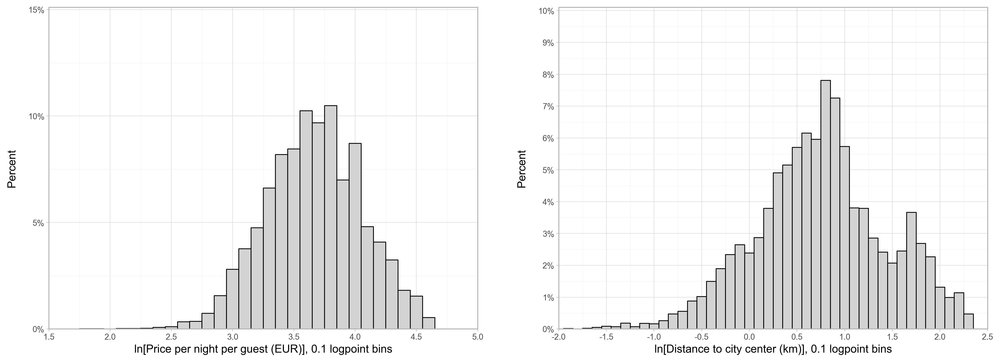

In [77]:
pw.basefigure.clear()
gg_hists = []
gg_hists.append(
    ggplot(data_ppgd)
    + aes(x = 'ln_price_per_guest')
    + geom_histogram(aes(y=after_stat("count / np.sum(count)")),
                     binwidth = 0.1,
                     color = 'black',
                     fill = 'lightgrey'
                    )
    + theme_light()
    + scale_x_continuous(expand=(0, 0), limits=(1.5, 5), breaks=np.arange(1.5,5.1,0.5))
    + scale_y_continuous(expand=(0, 0),
                         limits = (0,0.151),
                         breaks=np.arange(0,0.16,0.05),
                         labels=percent_format()
                        )
    + labs(x = 'ln[Price per night per guest (EUR)], 0.1 logpoint bins', y = 'Percent')
)
gg_hists.append(
    ggplot(data_ppgd)
    + aes(x = 'ln_distance_to_center')
    + geom_histogram(aes(y=after_stat("count / np.sum(count)")),
                     binwidth = 0.1,
                     color = 'black',
                     fill = 'lightgrey'
                    )
    + theme_light()
    + scale_x_continuous(expand=(0, 0),
                         limits=(-2, 2.5),
                         breaks=np.arange(-2,2.51,0.5)
                        )
    + scale_y_continuous(expand=(0, 0),
                         limits = (0,0.101),
                         breaks=np.arange(0,0.11,0.01),
                         labels=percent_format()
                        )
    + labs(x = 'ln[Distance to city center (km)], 0.1 logpoint bins', y = 'Percent')
)
pl = []
for p in gg_hists:
    pl.append(pw.load_ggplot(p))
combined = pl[0]|pl[1]
combined.savefig('ppg_dist_histograms_ln_filtered.png')
display(combined)

# LOWESS estimates

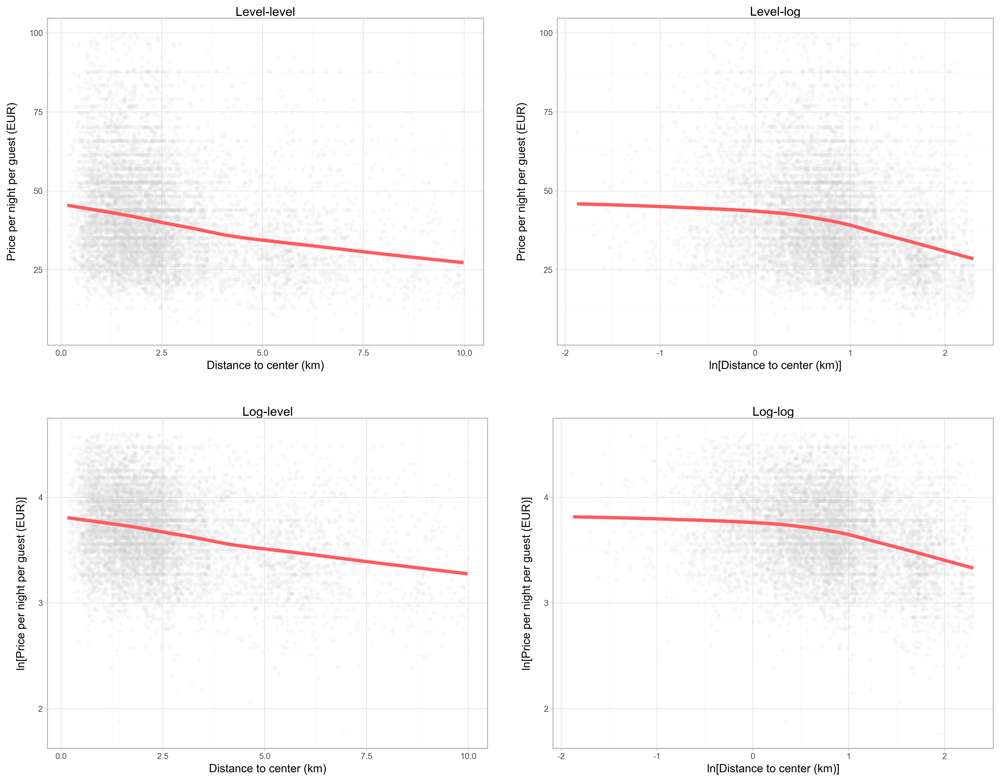

In [79]:
pw.basefigure.clear()
p1 = (
    ggplot(data_ppgd)
    + aes(x = 'distance_to_center', y = 'price_per_guest')
    + geom_point(alpha = 0.1, color = 'lightgrey')
    + geom_smooth(method = 'lowess', color = '#FF5A5F', size = 2)
    + theme_light()
    + labs(
        x = 'Distance to center (km)',
        y = 'Price per night per guest (EUR)',
        title = 'Level-level'
    )
)
p2 = (
    ggplot(data_ppgd)
    + aes(x = 'np.log(distance_to_center)', y = 'price_per_guest')
    + geom_point(alpha = 0.1, color = 'lightgrey')
    + geom_smooth(method = 'lowess', color = '#FF5A5F', size = 2)
    + theme_light()
    + labs(
        x = 'ln[Distance to center (km)]',
        y = 'Price per night per guest (EUR)',
        title = 'Level-log'
    )
)
p3 = (
    ggplot(data_ppgd)
    + aes(x = 'distance_to_center', y = 'np.log(price_per_guest)')
    + geom_point(alpha = 0.1, color = 'lightgrey')
    + geom_smooth(method = 'lowess', color = '#FF5A5F', size = 2)
    + theme_light()
    + labs(
        x = 'Distance to center (km)',
        y = 'ln[Price per night per guest (EUR)]',
        title = 'Log-level'
    )
)
p4 = (
    ggplot(data_ppgd)
    + aes(x = 'np.log(distance_to_center)', y = 'np.log(price_per_guest)')
    + geom_point(alpha = 0.1, color = 'lightgrey')
    + geom_smooth(method = 'lowess', color = '#FF5A5F', size = 2)
    + theme_light()
    + labs(
        x = 'ln[Distance to center (km)]',
        y = 'ln[Price per night per guest (EUR)]',
        title = 'Log-log'
    )
)
p1 = pw.load_ggplot(p1)
p2 = pw.load_ggplot(p2)
p3 = pw.load_ggplot(p3)
p4 = pw.load_ggplot(p4)
combined = (p1|p2)/(p3|p4)
combined.savefig('lowess_estimates.png')
display(combined)

# Regression analysis

Let's define a function for PLS calculations.

In [80]:
def lspline(series, knots):
    def knot_ceil(vector, knot):
        vector_copy = copy.deepcopy(vector)
        vector_copy[vector_copy > knot] = knot
        return vector_copy

    if type(knots) != list:
        knots = [knots]
    design_matrix = None
    vector = series.values

    for i in range(len(knots)):
        # print(i)
        # print(vector)
        if i == 0:
            column = knot_ceil(vector, knots[i])
        else:
            column = knot_ceil(vector, knots[i] - knots[i - 1])
        # print(column)
        if i == 0:
            design_matrix = column
        else:
            design_matrix = np.column_stack((design_matrix, column))
        # print(design_matrix)
        vector = vector - column
    design_matrix = np.column_stack((design_matrix, vector))
    # print(design_matrix)
    return design_matrix

In [85]:
regs_ppgd = []
regs_ppgd.append(smf.ols("price_per_guest ~ distance_to_center", data=data_ppgd).fit(cov_type='HC1'))
regs_ppgd.append(smf.ols("price_per_guest ~ np.log(distance_to_center)", data=data_ppgd).fit(cov_type='HC1'))
regs_ppgd.append(smf.ols("np.log(price_per_guest) ~ distance_to_center", data=data_ppgd).fit(cov_type='HC1'))
regs_ppgd.append(smf.ols("np.log(price_per_guest) ~ np.log(distance_to_center)", data=data_ppgd).fit(cov_type='HC1'))
regs_ppgd.append(smf.ols("np.log(price_per_guest) ~ lspline(distance_to_center,[4])", data=data_ppgd).fit(cov_type='HC1'))
regs_ppgd.append(smf.ols("np.log(price_per_guest) ~ np.log(distance_to_center) + np.power(np.log(distance_to_center),2)", data=data_ppgd).fit(cov_type='HC1'))
table_ppgd = Stargazer(regs_ppgd)
table_ppgd.custom_columns(['Level-level','Level-log','Log-level','Log-log','Log-level with PLS', 'Log-log Quadratic'])
table_ppgd.rename_covariates(
    {
        "Intercept": "Constant",
        'distance_to_center' : 'Distance to center (km)',
        'lspline(distance_to_center, [4])[0]' : 'Distance to center (km) < 4',
        'lspline(distance_to_center, [4])[1]' : 'Distance to center (km) > 4',
        'np.log(distance_to_center)' : 'ln[Distance to center (km)]',
        'np.power(np.log(distance_to_center), 2)' : 'ln[Distance to center (km)]²'
    }
)
table_ppgd.add_custom_notes(['Heteroscedasticity corrected standard errors used (HC1).'])
table_ppgd

In [95]:
table_ppgd.render_html()

'<table style="text-align:center"><tr><td colspan="7" style="border-bottom: 1px solid black"></td></tr>\n<tr><td style="text-align:left"></td><tr><td></td><td colspan="1">Level-level</td><td colspan="1">Level-log</td><td colspan="1">Log-level</td><td colspan="1">Log-log</td><td colspan="1">Log-level with PLS</td><td colspan="1">Log-log Quadratic</td></tr><tr><td style="text-align:left"></td><td>(1)</td><td>(2)</td><td>(3)</td><td>(4)</td><td>(5)</td><td>(6)</td></tr>\n<tr><td colspan="7" style="border-bottom: 1px solid black"></td></tr>\n\n<tr><td style="text-align:left">Constant</td><td>47.401<sup>***</sup></td><td>46.044<sup>***</sup></td><td>3.809<sup>***</sup></td><td>3.769<sup>***</sup></td><td>3.831<sup>***</sup></td><td>3.767<sup>***</sup></td></tr>\n<tr><td style="text-align:left"></td><td>(0.314)</td><td>(0.280)</td><td>(0.007)</td><td>(0.006)</td><td>(0.010)</td><td>(0.006)</td></tr>\n<tr><td style="text-align:left">Distance to center (km)</td><td>-2.049<sup>***</sup></td><td

In [101]:
regs_ppgd[4].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     np.log(price_per_guest)   R-squared:                       0.072
Model:                                 OLS   Adj. R-squared:                  0.072
Method:                      Least Squares   F-statistic:                     282.2
Date:                     Tue, 19 Nov 2024   Prob (F-statistic):          3.59e-119
Time:                             11:22:28   Log-Likelihood:                -3570.8
No. Observations:                     8080   AIC:                             7148.
Df Residuals:                         8077   BIC:                             7169.
Df Model:                                2                                         
Covariance Type:                       HC1                                         
=======================================================================================================
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               3.8305      0.010    372.801      0.000       3.810       3.851
lspline(distance_to_center, [4])[0]    -0.0670      0.005    -14.598      0.000      -0.076      -0.058
lspline(distance_to_center, [4])[1]    -0.0423      0.006     -7.675      0.000      -0.053      -0.031
==============================================================================
Omnibus:                        4.920   Durbin-Watson:                   1.896
Prob(Omnibus):                  0.085   Jarque-Bera (JB):                4.932
Skew:                          -0.053   Prob(JB):                       0.0849
Kurtosis:                       2.941   Cond. No.                         7.55
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
"""

In [99]:
data_ppgd['ppg_pred_d_loess'] = sm.nonparametric.lowess(data_ppgd['price_per_guest'], data_ppgd['distance_to_center'], frac=0.66, return_sorted=False)
data_ppgd['ppg_pred_lnd_loess'] = sm.nonparametric.lowess(data_ppgd['price_per_guest'], data_ppgd['ln_distance_to_center'], frac=0.66, return_sorted=False)
data_ppgd['lnppg_pred_d_loess'] = sm.nonparametric.lowess(data_ppgd['ln_price_per_guest'], data_ppgd['distance_to_center'], frac=0.66, return_sorted=False)
data_ppgd['lnppg_pred_lnd_loess'] = sm.nonparametric.lowess(data_ppgd['ln_price_per_guest'], data_ppgd['ln_distance_to_center'], frac=0.66, return_sorted=False)

z = regs_ppgd[0].get_prediction().conf_int()
res = regs_ppgd[0].get_prediction().summary_frame()
data_ppgd["ppg_pred_d"] = res["mean"]
data_ppgd["ppg_pred_dCIUP"] = [x[0] for x in z]
data_ppgd["ppg_pred_dCILO"] = [x[1] for x in z]

z = regs_ppgd[1].get_prediction().conf_int()
res = regs_ppgd[1].get_prediction().summary_frame()
data_ppgd["ppg_pred_lnd"] = res["mean"]
data_ppgd["ppg_pred_lndCIUP"] = [x[0] for x in z]
data_ppgd["ppg_pred_lndCILO"] = [x[1] for x in z]

z = regs_ppgd[2].get_prediction().conf_int()
res = regs_ppgd[2].get_prediction().summary_frame()
data_ppgd["lnppg_pred_d"] = res["mean"]
data_ppgd["lnppg_pred_dCIUP"] = [x[0] for x in z]
data_ppgd["lnppg_pred_dCILO"] = [x[1] for x in z]

z = regs_ppgd[3].get_prediction().conf_int()
res = regs_ppgd[3].get_prediction().summary_frame()
data_ppgd["lnppg_pred_lnd"] = res["mean"]
data_ppgd["lnppg_pred_lndCIUP"] = [x[0] for x in z]
data_ppgd["lnppg_pred_lndCILO"] = [x[1] for x in z]

z = regs_ppgd[4].get_prediction().conf_int()
res = regs_ppgd[4].get_prediction().summary_frame()
data_ppgd["lnppg_pred_dspl"] = res["mean"]
data_ppgd["lnppg_pred_dsplCIUP"] = [x[0] for x in z]
data_ppgd["lnppg_pred_dsplCILO"] = [x[1] for x in z]

z = regs_ppgd[5].get_prediction().conf_int()
res = regs_ppgd[5].get_prediction().summary_frame()
data_ppgd["lnppg_pred_lndq"] = res["mean"]
data_ppgd["lnppg_pred_lndqCIUP"] = [x[0] for x in z]
data_ppgd["lnppg_pred_lndqCILO"] = [x[1] for x in z]

In [103]:
plot_linlin = data_ppgd.filter(
    ['distance_to_center', 'ppg_pred_d_loess',
     'ppg_pred_d', 'ppg_pred_dCIUP', 'ppg_pred_dCILO']).melt(id_vars = ['distance_to_center']).assign(
    CI=lambda x: x["variable"].str.contains("CI")).assign(
    estimate=lambda x: np.where(x["CI"], x["variable"].str[:-4], x["variable"]))
plot_linlog = data_ppgd.filter(
    ['ln_distance_to_center', 'ppg_pred_lnd_loess',
     'ppg_pred_lnd', 'ppg_pred_lndCIUP', 'ppg_pred_lndCILO']).melt(id_vars = ['ln_distance_to_center']).assign(
    CI=lambda x: x["variable"].str.contains("CI")).assign(
    estimate=lambda x: np.where(x["CI"], x["variable"].str[:-4], x["variable"]))
plot_loglin = data_ppgd.filter(
    ['distance_to_center', 'lnppg_pred_d_loess',
     'lnppg_pred_d', 'lnppg_pred_dCIUP', 'lnppg_pred_dCILO',
     'lnppg_pred_dspl', 'lnppg_pred_dsplCIUP', 'lnppg_pred_dsplCILO']).melt(id_vars = ['distance_to_center']).assign(
    CI=lambda x: x["variable"].str.contains("CI")).assign(
    estimate=lambda x: np.where(x["CI"], x["variable"].str[:-4], x["variable"]))
plot_loglog = data_ppgd.filter(
    ['ln_distance_to_center', 'lnppg_pred_lnd_loess',
     'lnppg_pred_lnd', 'lnppg_pred_lndCIUP', 'lnppg_pred_lndCILO',
     'lnppg_pred_lndq', 'lnppg_pred_lndqCIUP', 'lnppg_pred_lndqCILO']).melt(id_vars = ['ln_distance_to_center']).assign(
    CI=lambda x: x["variable"].str.contains("CI")).assign(
    estimate=lambda x: np.where(x["CI"], x["variable"].str[:-4], x["variable"]))

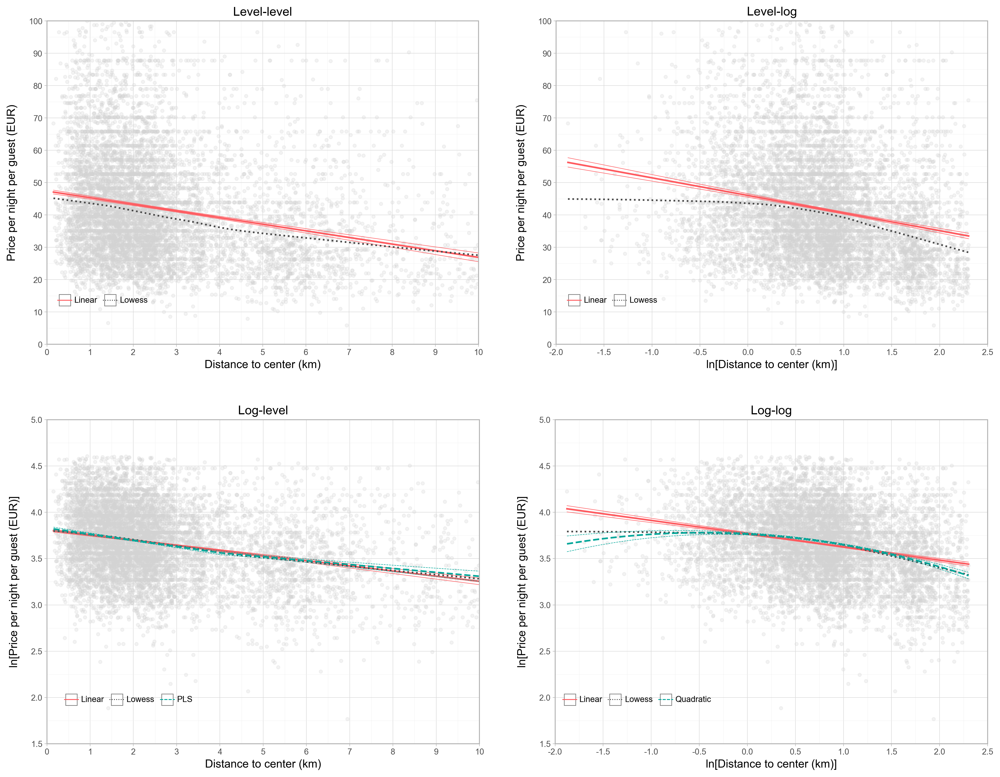

In [105]:
pw.basefigure.clear()
p1 = (
    ggplot(plot_linlin)
    + geom_point(aes(x='distance_to_center', y='price_per_guest'),
                 data=data_ppgd,
                 color='lightgrey',
                 alpha = 0.25
                )
    + geom_line(aes(x='distance_to_center', 
                    y='value', 
                    group='variable', 
                    color='estimate', 
                    linetype='estimate', 
                    size='CI')
               )
    + scale_size_manual(values=[1, 0.3])
    + theme_light()
    + labs(x="Distance to center (km)", y="Price per night per guest (EUR)", title='Level-level')
    + scale_color_manual(
        values=['#FF5A5F', '#484848'],
        labels=["Linear", "Lowess"]
    )
    + scale_linetype_manual(
        values=["-", ":"],
        labels=["Linear", "Lowess"]
    )
    + theme(
        legend_position=(0.2, 0.2),
        legend_direction="horizontal",
        legend_title=element_blank(),
        legend_background=element_blank(),
    )
    + guides(size='none')
    + scale_x_continuous(expand=(0, 0),
                         limits=(0, 10),
                         breaks=np.arange(0,11,1)
                        )
    + scale_y_continuous(expand=(0, 0),
                         limits = (0,100),
                         breaks=np.arange(0,101,10)
                        )
)

p2 = (
    ggplot(plot_linlog)
    + geom_point(aes(x='ln_distance_to_center', y='price_per_guest'),
                 data=data_ppgd,
                 color='lightgrey',
                 alpha = 0.25
                )
    + geom_line(aes(x = 'ln_distance_to_center',
                    y = 'value',
                    group="variable",
                    color="estimate",
                    linetype="estimate",
                    size="CI",
                   )
               )
    + scale_size_manual(values=(1, 0.3), guide=None)
    + theme_light()
    + labs(x="ln[Distance to center (km)]", y="Price per night per guest (EUR)", title='Level-log')
    + scale_color_manual(
        values=['#FF5A5F', '#484848'],
        labels=["Linear", "Lowess"],
    )
    + scale_linetype_manual(
        values=["-", ":"],
        labels=["Linear", "Lowess"],
    )
    + theme(
        legend_position=(0.2, 0.2),
        legend_direction="horizontal",
        legend_title=element_blank(),
        legend_background=element_blank(),
    )
    + guides(size='none')
    + scale_x_continuous(expand=(0, 0),
                         limits=(-2,2.5),
                         breaks=np.arange(-2,2.6,0.5)
                        )
    + scale_y_continuous(expand=(0, 0),
                         limits = (0,100),
                         breaks=np.arange(0,101,10)
                        )
)

p3 = (
    ggplot(plot_loglin)
    + geom_point(aes(x='distance_to_center', y='ln_price_per_guest'),
                 data=data_ppgd,
                 color='lightgrey',
                 alpha = 0.25
                )
    + geom_line(
        aes(x = 'distance_to_center',
            y = 'value',
            group="variable",
            color="estimate",
            linetype="estimate",
            size="CI",
         )
    )
    + scale_size_manual(values=(1, 0.3), guide=None)
    + theme_light()
    + labs(x="Distance to center (km)", y="ln[Price per night per guest (EUR)]", title='Log-level')
    + scale_color_manual(
        values=['#FF5A5F', '#484848', '#00A699'],
        labels=["Linear", "Lowess", "PLS"],
    )
    + scale_linetype_manual(
        values=["-", ":", "dashed"],
        labels=["Linear", "Lowess", "PLS"],
    )
    + theme(
        legend_position=(0.25, 0.2),
        legend_direction="horizontal",
        legend_title=element_blank(),
        legend_background=element_blank(),
    )
    + guides(size='none')
    + scale_x_continuous(expand=(0, 0),
                         limits=(0, 10),
                         breaks=np.arange(0,11,1)
                        )
    + scale_y_continuous(expand=(0, 0),
                         limits = (1.5,5),
                         breaks=np.arange(1.5,5.1,0.5)
                        )
)

p4 = (
    ggplot(plot_loglog)
    + geom_point(aes(x='ln_distance_to_center', y='ln_price_per_guest'),
                 data=data_ppgd,
                 color='lightgrey',
                 alpha = 0.25
                )
    + geom_line(
        aes(x = 'ln_distance_to_center',
            y = 'value',
            group="variable",
            color="estimate",
            linetype="estimate",
            size="CI",
           )
    )
    + scale_size_manual(values=(1, 0.3), guide=None)
    + theme_light()
    + labs(x="ln[Distance to center (km)]", y="ln[Price per night per guest (EUR)]", title='Log-log')
    + scale_color_manual(
        values=['#FF5A5F', '#484848', '#00A699'],
        labels=["Linear", "Lowess", "Quadratic"],
    )
    + scale_linetype_manual(
        values=["-", ":", "dashed"],
        labels=["Linear", "Lowess", "Quadratic"],
    )
    + theme(
        legend_position=(0.25, 0.2),
        legend_direction="horizontal",
        legend_title=element_blank(),
        legend_background=element_blank(),
    )
    + guides(size='none')
    + scale_x_continuous(expand=(0, 0),
                         limits=(-2,2.5),
                         breaks=np.arange(-2,2.6,0.5)
                        )
    + scale_y_continuous(expand=(0, 0),
                         limits = (1.5,5),
                         breaks=np.arange(1.5,5.1,0.5)
                        )
)
p1 = pw.load_ggplot(p1)
p2 = pw.load_ggplot(p2)
p3 = pw.load_ggplot(p3)
p4 = pw.load_ggplot(p4)
combined = (p1|p2)/(p3|p4)
combined.savefig('model_comparison_charts.png')
display(combined)

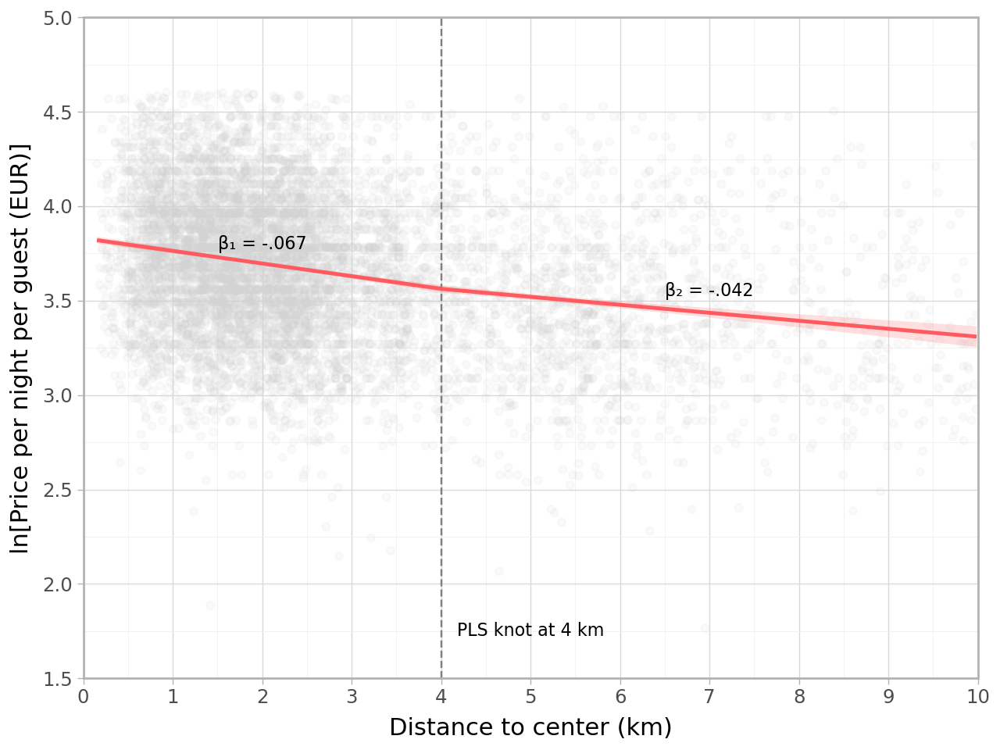

In [111]:
p1 = (
    ggplot(data_ppgd)
    + aes(x = 'distance_to_center', y = 'ln_price_per_guest')
    + geom_point(alpha = 0.1, color = 'lightgrey')
    + geom_vline(xintercept = 4, color = 'grey', size = 0.5, linetype = 'dashed')
    + geom_ribbon(aes(ymin = 'lnppg_pred_dsplCILO', ymax = 'lnppg_pred_dsplCIUP'), fill = '#FF5A5F', alpha = 0.2)
    + geom_line(aes(y = 'lnppg_pred_dspl'), color = '#FF5A5F', size = 1)
    + annotate("text", x=5, y=1.75, label="PLS knot at 4 km", size=8, color = 'black')
    + annotate("text", x=2, y=3.8, label="β₁ = -.067", size=8, color = 'black')
    + annotate("text", x=7, y=3.55, label="β₂ = -.042", size=8, color = 'black')
    + theme_light()
    + scale_y_continuous(expand=(0, 0), limits=(1.5, 5), breaks=np.arange(1.5, 5.1, 0.5))
    + scale_x_continuous(expand=(0, 0), limits=(0, 10), breaks=np.arange(0, 10.1, 1))
    + labs(x = 'Distance to center (km)', y = 'ln[Price per night per guest (EUR)]')
)
p1.save('pls_model_graph.png', dpi = 200)
display(p1)

# Checking the residuals

In [113]:
data_ppgd['e'] = regs_ppgd[4].resid

In [115]:
residual_variance = np.var(data_ppgd['e'])
residual_variance

0.14170371626767725

In [117]:
data_ppgd["reg_result"] = np.where(data_ppgd["e"] >= 0, "overpriced", "underpriced")

data_ppgd["reg_result"] = np.where(
    data_ppgd["id"].isin(
        data_ppgd.sort_values(by="e", ascending=False).head(5)["id"].tolist()
    ),
    "top5",
    data_ppgd["reg_result"],
)
data_ppgd["reg_result"] = np.where(
    data_ppgd["id"].isin(
        data_ppgd.sort_values(by="e", ascending=False).tail(5)["id"].tolist()
    ),
    "bottom5",
    data_ppgd["reg_result"],
)

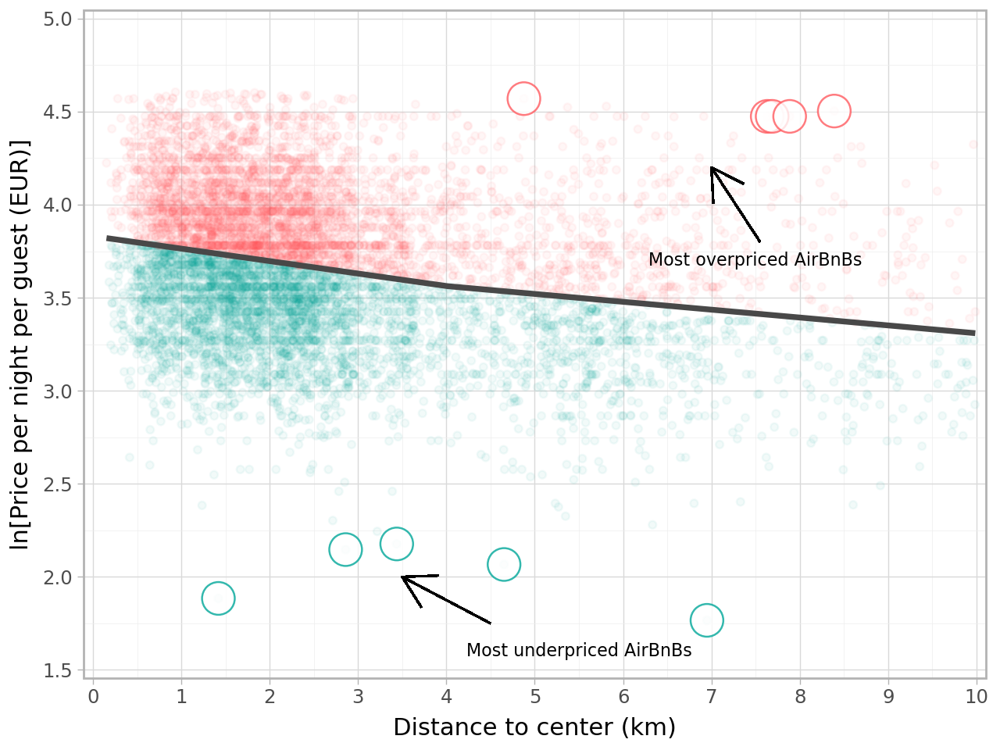

In [123]:
p1 = (
    ggplot(data_ppgd)
    + aes(x = 'distance_to_center', y = 'ln_price_per_guest', color = 'reg_result')
    + geom_point(alpha = 0.05)
    + geom_point(data = data_ppgd[data_ppgd['reg_result'] == 'bottom5'], alpha = 0.8, size = 8, fill = 'white', color = '#00A699')
    + geom_point(data = data_ppgd[data_ppgd['reg_result'] == 'top5'], alpha = 0.8, size = 8, fill = 'white', color = '#FF5A5F')
    + geom_line(aes(y = 'lnppg_pred_dspl'), color = '#484848', size = 1.5)
    + geom_segment(aes(x=4.5, y=1.75, xend=3.5, yend=2), arrow=arrow(), color = 'black')
    + annotate("text", x=5.5, y=1.6, label="Most underpriced AirBnBs", size=8, color = 'black')
    + geom_segment(aes(x=7.55, y=3.8, xend=7, yend=4.2), arrow=arrow(), color = 'black')
    + annotate("text", x=7.5, y=3.7, label="Most overpriced AirBnBs", size=8, color = 'black')
    + theme_light()
    + scale_color_manual(
        values=['#00A699', '#FF5A5F', '#FF5A5F', '#00A699']
    )
    + guides(color=False)
    + scale_y_continuous(expand=(0.01, 0.01), limits=(1.5, 5), breaks=np.arange(1.5, 5.1, 0.5))
    + scale_x_continuous(expand=(0.01, 0.01), limits=(0, 10), breaks=np.arange(0, 10.1, 1))
    + labs(x = 'Distance to center (km)', y = 'ln[Price per night per guest (EUR)]')
)
p1.save('deal_selection_chart.png', dpi = 200)
display(p1)

In [125]:
data_ppgd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8080 entries, 0 to 10098
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     8080 non-null   int64  
 1   price_per_guest        8080 non-null   float64
 2   distance_to_center     8080 non-null   float64
 3   ln_price_per_guest     8080 non-null   float64
 4   ln_distance_to_center  8080 non-null   float64
 5   ppg_pred_d_loess       8080 non-null   float64
 6   ppg_pred_lnd_loess     8080 non-null   float64
 7   lnppg_pred_d_loess     8080 non-null   float64
 8   lnppg_pred_lnd_loess   8080 non-null   float64
 9   ppg_pred_d             8080 non-null   float64
 10  ppg_pred_dCIUP         8080 non-null   float64
 11  ppg_pred_dCILO         8080 non-null   float64
 12  ppg_pred_lnd           8080 non-null   float64
 13  ppg_pred_lndCIUP       8080 non-null   float64
 14  ppg_pred_lndCILO       8080 non-null   float64
 15  lnppg_pr

In [131]:
results = data.merge(data_ppgd, how = 'left', on = 'id')
results = results[(results['reg_result'] == 'top5') | (results['reg_result'] == 'bottom5')].sort_values('e')
results = results.filter([
    'id', 'reg_result', 'lnppg_pred_dspl', 'e', 'listing_url', 'distance_to_center', 'price', 'price_EUR', 'price_per_guest', 'ln_price_per_guest', 'neighbourhood_cleansed',
    'review_scores_rating', 'number_of_reviews', 'property_type', 'room_type', 'accommodates', 'reg_result'])
results['level_pred'] = results['lnppg_pred_dspl'].map(lambda x: np.exp(x)*np.exp(residual_variance/2))
results['pctg_level_diff'] = (results['price_per_guest'] / results['level_pred'] - 1)*100
results['level_diff'] = results['level_pred']-results['price_per_guest']
results = results.filter([
    'id',
    'price_per_guest',
    'distance_to_center',
    'lnppg_pred_dspl',
    'e',
    'level_pred',
    'pctg_level_diff'
])

In [133]:
results.applymap(lambda x: format(x, '.2f'))

,id,price_per_guest,distance_to_center,lnppg_pred_dspl,e,level_pred,pctg_level_diff
4232,833801927434015744.00,6.58,1.42,3.74,-1.85,44.98,-85.37
224,6291412.00,5.85,6.95,3.44,-1.67,33.40,-82.49
9545,1173863950508313088.00,8.56,2.86,3.64,-1.49,40.84,-79.05
1217,32684127.00,7.90,4.65,3.53,-1.47,36.81,-78.55
2473,583855494264588928.00,8.82,3.44,3.60,-1.42,39.29,-77.56
4230,833381244209057920.00,96.52,4.88,3.53,1.04,36.46,164.72
1633,42701431.00,87.75,7.63,3.41,1.07,32.45,170.36
6878,1000529416641035520.00,87.75,7.69,3.41,1.07,32.38,171.00
8048,1103424424967773696.00,87.75,7.89,3.40,1.08,32.11,173.28
2851,644075622945331584.00,90.29,8.39,3.38,1.13,31.43,187.27


In [135]:
data_f.describe().T[1:]

,count,mean,std,min,25%,50%,75%,max
price_EUR,8850.0,148.413858,201.634243,14.039398,85.201597,114.464967,166.959154,9652.086167
accommodates,10099.0,3.439251,1.810203,1.000000,2.000000,3.000000,4.000000,16.000000
host_acceptance_rate,8790.0,68.241638,33.167450,0.000000,50.000000,79.000000,100.000000,100.000000
number_of_reviews,10099.0,16.598970,43.616216,0.000000,0.000000,4.000000,14.000000,1161.000000
review_scores_rating,7385.0,4.831836,0.307867,1.000000,4.780000,4.940000,5.000000,5.000000
distance_to_center,10099.0,2.785987,2.056467,0.102713,1.405728,2.171893,3.427434,14.518127
price_per_guest,8850.0,46.054944,60.266076,5.849749,29.248746,39.485807,52.647743,3217.362056
nor_shifted,10099.0,16.867710,43.516070,1.000000,1.000000,4.000000,14.000000,1161.000000
har_shifted,8790.0,68.335495,32.975043,1.000000,50.000000,79.000000,100.000000,100.000000


# Robustness check to missing values in host acceptance rate

In [141]:
data_har_isna = (data_f[
              (data_f['price_per_guest'] <= 100)
              & (data_f['distance_to_center'] <= 10)
              & (data_f['accommodates'] <= 6)
          ])
data_har_notna = (data_f[
              (data_f['price_per_guest'] <= 100)
              & (data_f['distance_to_center'] <= 10)
              & (data_f['accommodates'] <= 6)
              & (data_f['host_acceptance_rate'].isna() == False)
          ])

In [143]:
reg_har_isna = smf.ols("np.log(price_per_guest) ~ lspline(distance_to_center,[4])", data=data_har_isna).fit(cov_type='HC1')
reg_har_notna = smf.ols("np.log(price_per_guest) ~ lspline(distance_to_center,[4])", data=data_har_notna).fit(cov_type='HC1')

In [151]:
table_rcheck = Stargazer([reg_har_isna,reg_har_notna])
table_rcheck

In [153]:
og_alpha = []
og_beta1 = []
og_beta2 = []
rc_alpha = []
rc_beta1 = []
rc_beta2 = []
alphaog_less_alpharc = []
beta1og_less_beta1rc = []
beta2og_less_beta2rc = []
for i in range(0,2500):
    bs = data_f.sample(n = 10099, replace = True, axis = 0)
    og = (bs[
              (bs['price_per_guest'] <= 100)
              & (bs['distance_to_center'] <= 10)
              & (bs['accommodates'] <= 6)
          ])
    rc = (bs[
              (bs['price_per_guest'] <= 100)
              & (bs['distance_to_center'] <= 10)
              & (bs['accommodates'] <= 6)
              & (bs['host_acceptance_rate'].isna() == False)
          ])
    reg_rc = smf.ols("np.log(price_per_guest) ~ lspline(distance_to_center,[4])", data=rc).fit(cov_type='HC1')
    reg_og = smf.ols("np.log(price_per_guest) ~ lspline(distance_to_center,[4])", data=og).fit(cov_type='HC1')
    og_alpha.append(reg_og.params[0])
    og_beta1.append(reg_og.params[1])
    og_beta2.append(reg_og.params[2])
    rc_alpha.append(reg_rc.params[0])
    rc_beta1.append(reg_rc.params[1])
    rc_beta2.append(reg_rc.params[2])
    alphaog_less_alpharc.append(reg_og.params[0] - reg_rc.params[0])
    beta1og_less_beta1rc.append(reg_og.params[1] - reg_rc.params[1])
    beta2og_less_beta2rc.append(reg_og.params[2] - reg_rc.params[2])
alpha_se = np.std(alphaog_less_alpharc)
beta1_se = np.std(beta1og_less_beta1rc)
beta2_se = np.std(beta2og_less_beta2rc)

In [157]:
t_stat_alpha = (reg_har_isna.params[0]-reg_har_notna.params[0])/alpha_se
t_stat_beta1 = (reg_har_isna.params[1]-reg_har_notna.params[1])/beta1_se
t_stat_beta2 = (reg_har_isna.params[2]-reg_har_notna.params[2])/beta2_se

In [159]:
print(t_stat_alpha)
print(t_stat_beta1)
print(t_stat_beta2)

0.22802628509059747
4.008638404873933
1.505883968946653
